<a href="https://colab.research.google.com/github/Dikabagas/Customer_Churn_Segmentation/blob/main/Project%20Customer%20Churn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#1. Persiapan Library<a class="anchor" id="library"></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, get_scorer
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.metrics import confusion_matrix
# from sklearn.metrics import plot_confusion_matrix
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE

import statsmodels as sm
import missingno as mno

pd.set_option("display.max_columns", None)
pd.options.display.float_format = '{:,.2f}'.format
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from matplotlib import rcParams

rcParams['figure.figsize'] = 20, 4
rcParams['lines.linewidth'] = 3
rcParams['xtick.labelsize'] = 'x-large'
rcParams['ytick.labelsize'] = 'x-large'

In [ ]:
def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model, hyperparameters):
    for key, value in hyperparameters.items() :
        print('Best '+key+':', model.get_params()[key])

In [ ]:
#function untuk menampilkan nilai pada bin/plot

def show_values(axs, orient="v", space=.01):
    def _single(ax):
        if orient == "v":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() / 2
                _y = p.get_y() + p.get_height() - (p.get_height()*0.5)  #disini untuk mengatur tinggi
                # value = '{:.2f}'.format(p.get_height())
                value = '{:d}'.format(p.get_height())
                ax.text(_x, _y, value, ha="center", weight='bold',size='x-large')
        elif orient == "h":
            for p in ax.patches:
                _x = p.get_x() + p.get_width() + float(space)  # disini untuk menggeser
                _y = p.get_y() + p.get_height() - (p.get_height()*0.01)
                value = '{:.2f}'.format(p.get_width())
                ax.text(_x, _y, value, ha="left", weight='bold')

    if isinstance(axs, np.ndarray):
        for idx, ax in np.ndenumerate(axs):
            _single(ax)
    else:
        _single(axs)

In [ ]:
from google.colab import files
docs = files.upload()

Saving Data Train.csv to Data Train.csv


## Data Reading

In [ ]:
df_train = pd.read_csv("Data Train.csv")
display(df_train.head(),df_train.shape,df_train.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,no
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,no
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,no
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,no
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,no


(4250, 20)

None

<Axes: >

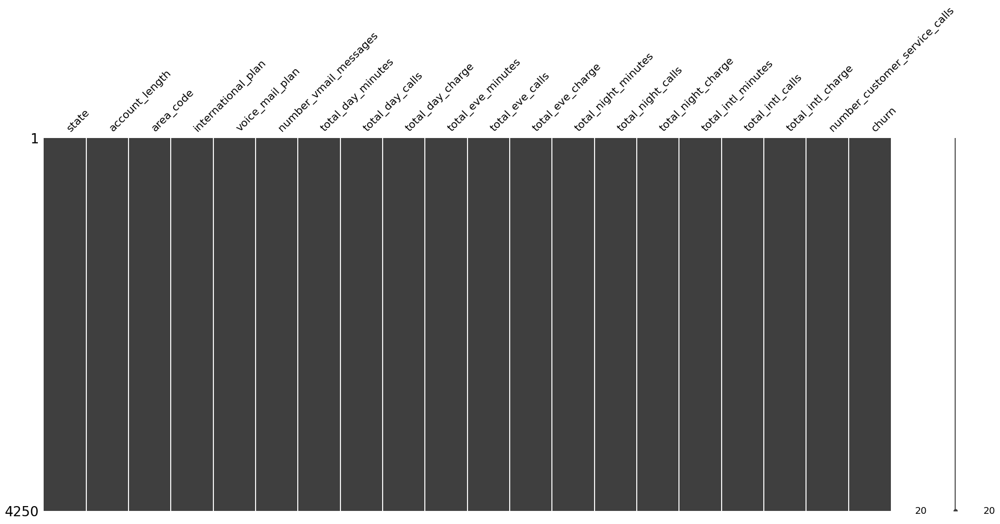

In [ ]:
mno.matrix(df_train)

# EXPLORATORY DATA ANALYSIS (EDA)

##1. Descriptive Statistics

In [ ]:
def summary_tab(df):
  summary = pd.DataFrame({
      'Kolom' : df.columns,
      'dataTypes' : df.dtypes,
      'null' : df.isna().sum(),
      'null_percentage' : round(df.isna().sum()/len(df)*100,2),
      'unique' : df.nunique(),
      'unique_sample' : [list(df[i].drop_duplicates().sample(2)) for i in df.columns]
      })
  summary['unique_%'] = round(summary['unique']/len(df)*100,2)
  return summary.reset_index(drop=True)

In [ ]:
summary_tab(df_train)

,Kolom,dataTypes,null,null_percentage,unique,unique_sample,unique_%
0,state,object,0,0.0,51,"[KS, MD]",1.20
1,account_length,int64,0,0.0,215,"[62, 155]",5.06
2,area_code,object,0,0.0,3,"[area_code_510, area_code_415]",0.07
3,international_plan,object,0,0.0,2,"[yes, no]",0.05
4,voice_mail_plan,object,0,0.0,2,"[yes, no]",0.05
5,number_vmail_messages,int64,0,0.0,46,"[8, 35]",1.08
6,total_day_minutes,float64,0,0.0,1843,"[55.3, 234.8]",43.36
7,total_day_calls,int64,0,0.0,120,"[44, 158]",2.82
8,total_day_charge,float64,0,0.0,1843,"[43.01, 28.87]",43.36
9,total_eve_minutes,float64,0,0.0,1773,"[265.7, 193.0]",41.72


In [ ]:
# nums = df_train.select_dtypes(include='number').columns
# cats = df_train.select_dtypes(include='object').columns
# display(nums, cats)

In [ ]:
# df_train[nums].describe().round(2)

Beberapa pengamatan:
1. Kolom `account_length`,`total_day_minutes`, `total_day_calls`, `total_eve_minute`, `total_eve_calls`,`total_nights_minutes`, `total_nights_calls`, `total_night_charge`, `total_intl_minutes`, `total_intl_calls`, `total_intl_charge` tampak sudah cukup simetrik distribusinya (mean dan median tak berbeda jauh)
2. Kolom `number_vmail_messages`,`number_customer_service_calls` tampaknya skew ke kanan (long-right tail), mungkin dapat dilakukan transformasi log nantinya

In [ ]:
# df_train[cats].describe()

Dataset train pada Telco Churn tidak memiliki _null variable_ dan setiap kolom telah sesuai dengan tipe datanya. Berdasarkan Analisa Statistika:
- Seluruh kolom terkecuali kolom `number_vmail_messages`, memiliki nilai mean dan median yang hampir sama. Kolom-kolom ini berdistribusi normal.

- Data dinominasi (proporsi lebih dari 50% dari jumlah baris data) oleh area_code_415 (`area_code`), no (`international_plan`), no (`voice_mail_plan`) dan no (`churn`)

- Kolom `state` memiliki kardinalitas (jumlah unique values) yang cukup tinggi (51). Tampaknya kita perlu exclude fitur ini dari dataset untuk pemodelan.

- Kolom `churn` adalah target/label

In [ ]:
numerical = df_train.select_dtypes(include='number')
categorical = df_train.select_dtypes(include='object')
display(numerical.head(3), categorical.head(3))

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
0,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
1,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
2,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2


,state,area_code,international_plan,voice_mail_plan,churn
0,OH,area_code_415,no,yes,no
1,NJ,area_code_415,no,no,no
2,OH,area_code_408,yes,no,no


In [ ]:
def get_len_outliers(df):

  #Menghitung 25th dan 75th percentile
  p75 = df.quantile(0.75)
  p25 = df.quantile(0.25)
  #Menghitung IQR dengan selisih 25th dan 75th percentile
  iqr = p75 - p25

  #"Minimum non-outlier value": 25th percentile - 1.5 * IQR
  min_val = p25 - 1.5*iqr
  #"Maximum non-outlier value": 75th percentile + 1.5 * IQR
  max_val = p75 + 1.5*iqr

  #Apapun di bawah minimum atau di atas maximum, disebut sebagai outlier
  outliers = df[(df < min_val) | (df > max_val)]
  return len(outliers)

In [ ]:
len(get_outliers(df_train['total_day_calls']))

28

In [ ]:
descript = df_train.describe(include='number').T
descript['num_outliers'] = numerical.apply(get_len_outliers).values

In [ ]:
descript

,count,mean,std,min,25%,50%,75%,max,num_outliers
account_length,4250.0,100.236235,39.698401,1.0,73.0000,100.00,127.0000,243.00,20
number_vmail_messages,4250.0,7.631765,13.439882,0.0,0.0000,0.00,16.0000,52.00,86
total_day_minutes,4250.0,180.259600,54.012373,0.0,143.3250,180.45,216.2000,351.50,25
total_day_calls,4250.0,99.907294,19.850817,0.0,87.0000,100.00,113.0000,165.00,28
total_day_charge,4250.0,30.644682,9.182096,0.0,24.3650,30.68,36.7500,59.76,26
total_eve_minutes,4250.0,200.173906,50.249518,0.0,165.9250,200.70,233.7750,359.30,34
total_eve_calls,4250.0,100.176471,19.908591,0.0,87.0000,100.00,114.0000,170.00,24
total_eve_charge,4250.0,17.015012,4.271212,0.0,14.1025,17.06,19.8675,30.54,34
total_night_minutes,4250.0,200.527882,50.353548,0.0,167.2250,200.45,234.7000,395.00,37
total_night_calls,4250.0,99.839529,20.093220,0.0,86.0000,100.00,113.0000,175.00,33


In [ ]:
for col in cats:
  print(f'value counts of column {col}')
  print(df_train[col].value_counts())
  print('---'*10, '\n')

##2. Univariate Analysis

Gunakan visualisasi untuk melihat distribusi masing-masing kolom (feature maupun target). Tuliskan hasil observasinya, misalnya jika ada suatu kolom yang distribusinya menarik (misal skewed, bimodal, ada outlier, ada nilai yang mendominasi, kategorinya terlalu banyak, dsb). Jelaskan juga apa yang harus di-follow up saat data pre-processsing.

<Axes: >

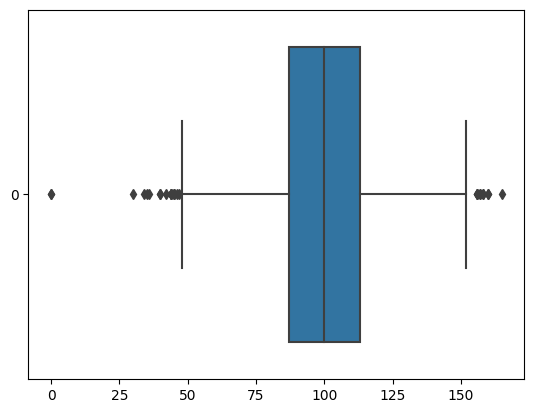

In [ ]:
sns.boxplot(df_train['total_day_calls'], orient='h')

<Axes: xlabel='total_day_calls', ylabel='Density'>

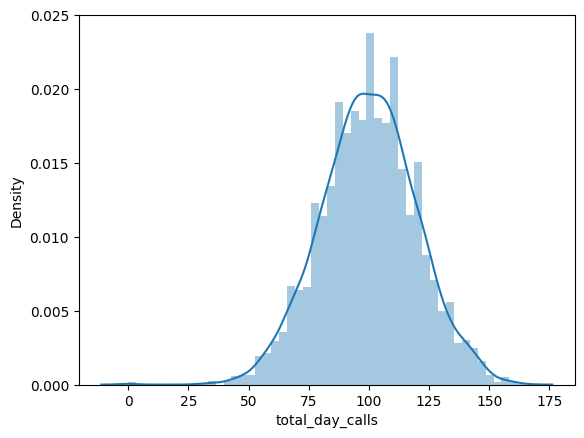

In [ ]:
sns.distplot(df_train['total_day_calls'])

<Axes: xlabel='total_day_calls', ylabel='Density'>

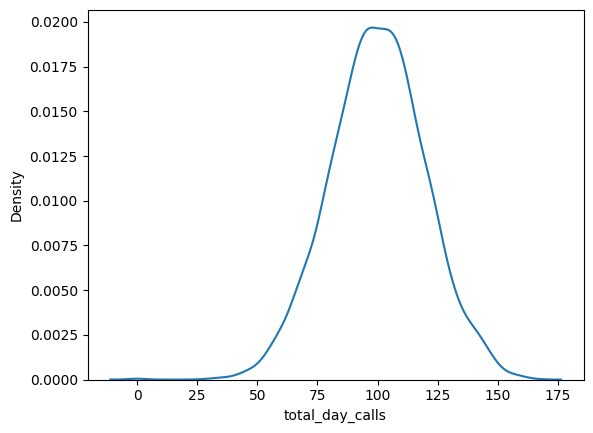

In [ ]:
sns.kdeplot(df_train['total_day_calls'])

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(0, len(nums)):
    plt.subplot(3, 5, i+1)
    sns.boxplot(y=df_train[nums[i]], orient='v')
    plt.tight_layout()

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(0, len(nums)):
    plt.subplot(3, 5,  i+1)
    sns.kdeplot(x = df_train[nums[i]])
    plt.xlabel(nums[i])
    plt.tight_layout()

Berdasarkan grafik distribusi diatas menyatakan
1. feature `account_length`,`total_day_minutes`, `total_day_calls`, `total_eve_minute`, `total_eve_calls`,`total_nights_minutes`, `total_nights_calls`, `total_night_charge`, `total_intl_minutes`, `total_intl_calls`, `total_intl_charge` terbentuk unimodal dan distribusi normal
2. feature `num_vmail_messages` terbentuk bimodal
3. feature `total_intl_calls`,`num_vmail_messages`, `number_customer_service_calls` positively Skewed
5. feature `number_customer_service_calls` terbentuk multimodal

In [ ]:
### Count plot (categorical)
# this one too heavy if we consider full dataset
# so we need to sample the data (400 rows)

df_sample = df_train.sample(400, random_state=42)
plt.figure(figsize=(20, 18))
for i in range(0, len(cats)):
    plt.subplot(2, 3, i+1)
    sns.countplot(x = df_sample[cats[i]], orient='v',palette='coolwarm')
    plt.tight_layout()

In [ ]:
#@title
def numerical_plot(df, features):
  fig, axs = plt.subplots(len(numerical.columns), 3, figsize=(30,60))

  for i,col in enumerate(features):

    sns.boxplot(df[col], ax=axs[i][0])
    sns.distplot(df[col], ax=axs[i][1])

    x = sns.kdeplot(df[col][df['churn'] == 'yes'], ax=axs[i][2], color='blue', shade=True)
    x = sns.kdeplot(df[col][df['churn'] == 'no'], ax=axs[i][2], color='red', shade=True)

    x.legend(['Churn','Not churn'], loc='upper right')
    axs[i][0].set_title("Mean = %.2f\nMedian = %.2f\nSTD = %.2f"%(df[col].mean(),df[col].median(),df[col].std()))
    plt.tight_layout()

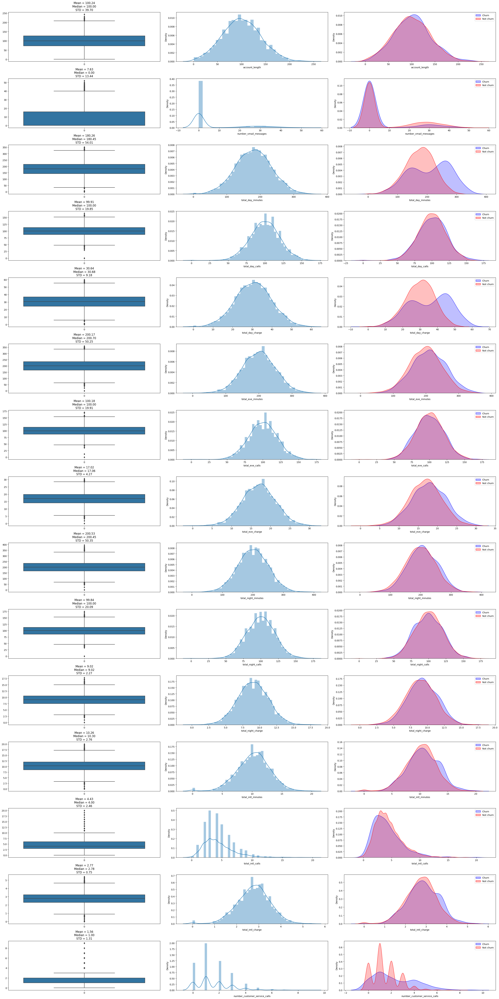

In [ ]:
#@title
numerical_plot(df_train, numerical.columns)

##3. Multivariate Analysis

In [ ]:
df_train.corr()

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
account_length,1.000000,-0.006626,-0.001612,0.023002,-0.001613,-0.010326,0.005535,-0.010322,-0.009916,-0.001846,-0.009942,0.004539,0.013690,0.004494,0.001002
number_vmail_messages,-0.006626,1.000000,0.002000,-0.006920,0.001994,0.010725,0.003593,0.010736,0.018308,0.001977,0.018300,0.005220,0.006585,0.005249,-0.015303
total_day_minutes,-0.001612,0.002000,1.000000,0.000747,1.000000,-0.013248,0.005986,-0.013258,0.010049,-0.004812,0.010036,-0.021369,0.003859,-0.021291,-0.002925
total_day_calls,0.023002,-0.006920,0.000747,1.000000,0.000751,0.008661,0.003739,0.008663,0.002206,-0.004815,0.002200,0.008834,0.009377,0.008909,-0.015845
total_day_charge,-0.001613,0.001994,1.000000,0.000751,1.000000,-0.013247,0.005985,-0.013257,0.010053,-0.004816,0.010040,-0.021374,0.003853,-0.021296,-0.002932
total_eve_minutes,-0.010326,0.010725,-0.013248,0.008661,-0.013247,1.000000,0.003101,1.000000,-0.014018,0.011973,-0.014031,-0.003509,0.012239,-0.003460,-0.010063
total_eve_calls,0.005535,0.003593,0.005986,0.003739,0.005985,0.003101,1.000000,0.003120,0.008425,-0.011929,0.008441,-0.013096,0.004949,-0.013145,0.006956
total_eve_charge,-0.010322,0.010736,-0.013258,0.008663,-0.013257,1.000000,0.003120,1.000000,-0.014022,0.011971,-0.014035,-0.003512,0.012239,-0.003463,-0.010071
total_night_minutes,-0.009916,0.018308,0.010049,0.002206,0.010053,-0.014018,0.008425,-0.014022,1.000000,0.023815,0.999999,-0.000113,-0.024280,-0.000047,-0.013771
total_night_calls,-0.001846,0.001977,-0.004812,-0.004815,-0.004816,0.011973,-0.011929,0.011971,0.023815,1.000000,0.023798,0.001093,0.003851,0.001054,-0.008893


<Axes: >

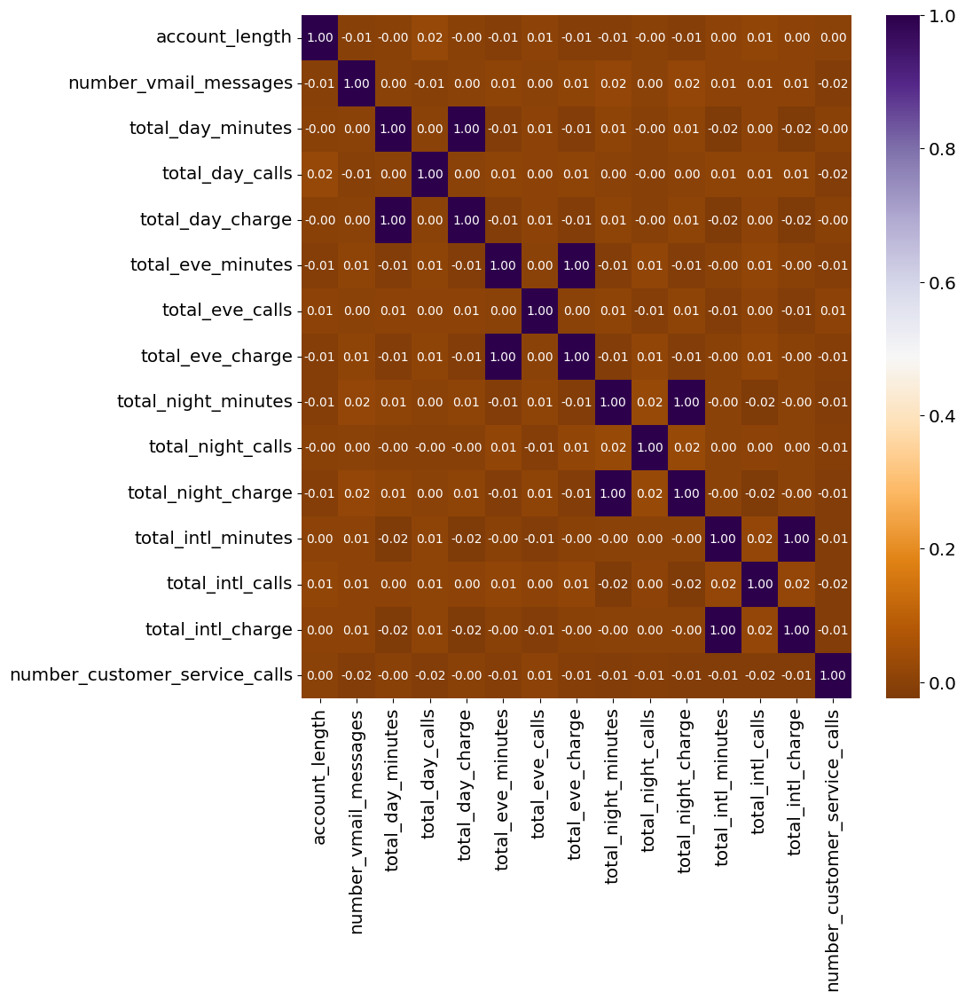

In [ ]:
# correlation heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(df_train.corr(), cmap='PuOr', annot=True, fmt='.2f')

Beberapa pengamatan :
- Ada korelasi redundan (>0.7) pada feature `total_day_minutes`, `total_eve_minutes`, `total_night_minutes`, `total_intl_minutes`

<Figure size 1500x1500 with 0 Axes>

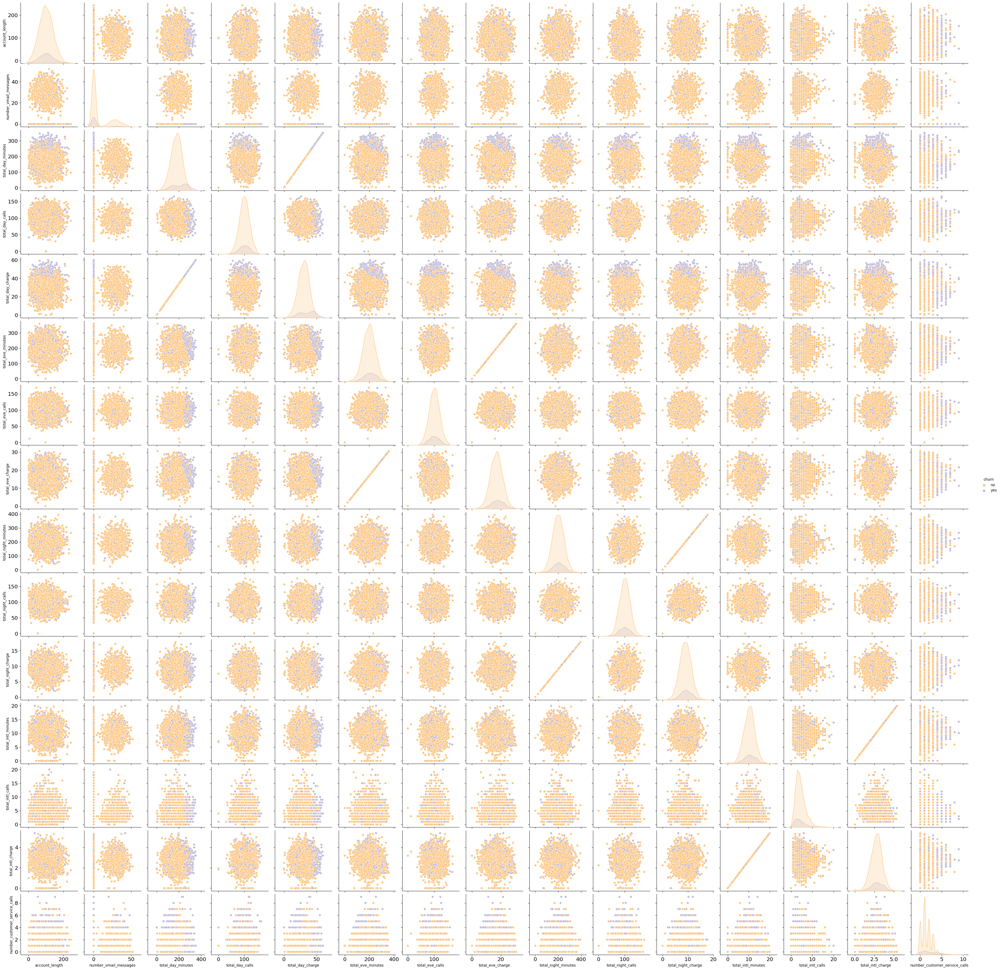

In [ ]:
# di sini kita juga hanya menggunakan sample dari full dataset
plt.figure(figsize=(15, 15))
sns.pairplot(df_train, diag_kind='kde',palette='PuOr',hue='churn')

##4. Business Insight

Selain EDA, lakukan juga beberapa analisis dan visualisasi untuk menemukan suatu business insight.

In [ ]:
#total exited
df_train.churn.value_counts(normalize=True)

no     0.859294
yes    0.140706
Name: churn, dtype: float64

In [ ]:
#total exited
df_train.churn.value_counts()

no     3652
yes     598
Name: churn, dtype: int64

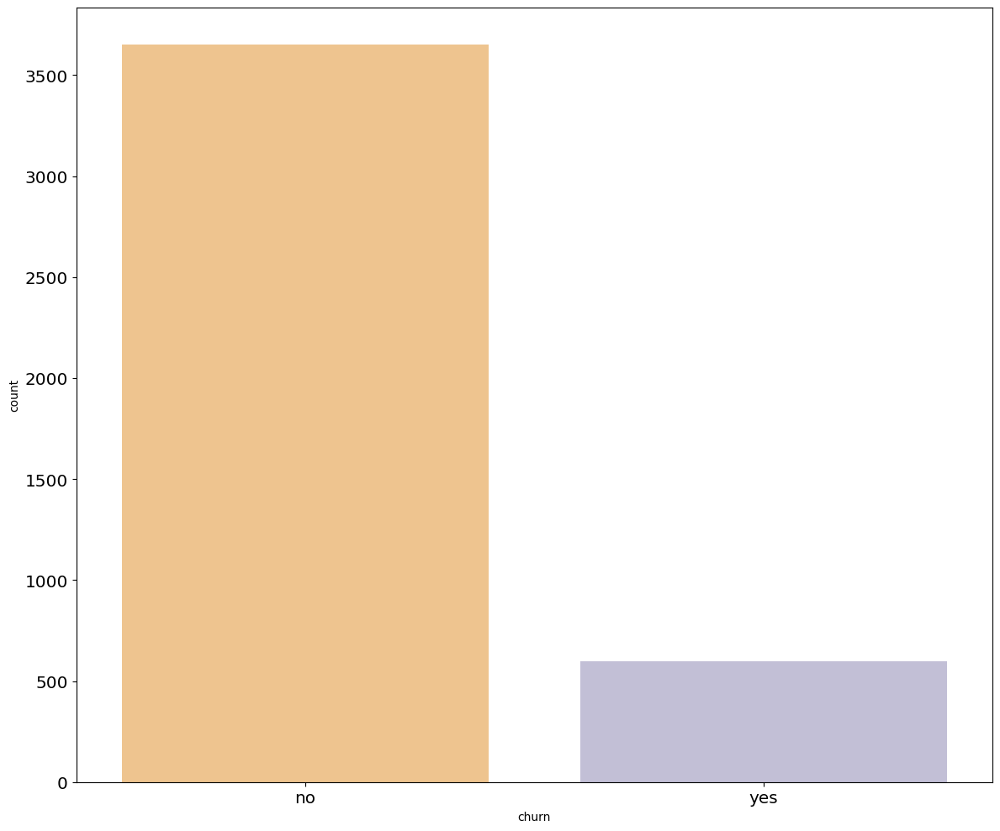

In [ ]:
plt.figure(figsize=(12,10))
ex = sns.countplot(x='churn', data=df_train, palette='PuOr')
plt.tight_layout()

# show_values(ex)

$\textbf{Dari visualisasi di atas dapat kita simpulkan:}$

Persentase yang tidak churn lebih banyak daripada yang churn yaitu sebesar 86% (3652 orang), sedangkan yang churn 14% (598 orang).

## Feature on Category vs Target

In [ ]:
plt.figure(figsize=(10, 8))
features = cats
for i in range(1, len(features)-1):
    plt.subplot(1, 3, i)
    sns.countplot(data=df_train, x='churn', hue=features[i],palette='coolwarm')
    plt.tight_layout()

- `area_code` 415 memiliki tingkat _churn_ tertinggi (dominan) dibandingkan area 408 dan 510

- `voice_mail_plan` = no merupakan dominan pada _customer_ yang akan _churn_

-----

# 1. Data Cleansing <a class="anchor" id="cleansing"></a>

Lakukan pembersihan data, sesuai yang diajarkan di kelas, seperti:<br>
A. Handle missing values<br>
B. Handle duplicated data<br>
C. Feature transformation<br>
D. Feature encoding<br>
E. Handle class imbalance<br>

### A. Handle _missing values_ <a class="anchor" id="missing"></a>

In [ ]:
#cek missing values
df_train.isna().sum()

state                            0
account_length                   0
area_code                        0
international_plan               0
voice_mail_plan                  0
number_vmail_messages            0
total_day_minutes                0
total_day_calls                  0
total_day_charge                 0
total_eve_minutes                0
total_eve_calls                  0
total_eve_charge                 0
total_night_minutes              0
total_night_calls                0
total_night_charge               0
total_intl_minutes               0
total_intl_calls                 0
total_intl_charge                0
number_customer_service_calls    0
churn                            0
dtype: int64

In [ ]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4250 entries, 0 to 4249
Data columns (total 20 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   state                          4250 non-null   object 
 1   account_length                 4250 non-null   int64  
 2   area_code                      4250 non-null   object 
 3   international_plan             4250 non-null   object 
 4   voice_mail_plan                4250 non-null   object 
 5   number_vmail_messages          4250 non-null   int64  
 6   total_day_minutes              4250 non-null   float64
 7   total_day_calls                4250 non-null   int64  
 8   total_day_charge               4250 non-null   float64
 9   total_eve_minutes              4250 non-null   float64
 10  total_eve_calls                4250 non-null   int64  
 11  total_eve_charge               4250 non-null   float64
 12  total_night_minutes            4250 non-null   f

### B. Handle duplicated data<a class="anchor" id="duplicated"></a>

In [ ]:
#cek duplikat data
df_train.duplicated().sum()

0

### C. Feature Encoding <a class="anchor" id="encode"></a>

In [ ]:
# churn menggunakan label encoding
mapping_churn = {
    'no' : 0,
    'yes' : 1
}

df_train['churn'] = df_train['churn'].map(mapping_churn)

In [ ]:
df_train.head()

,state,account_length,area_code,international_plan,voice_mail_plan,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls,churn
0,OH,107,area_code_415,no,yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
1,NJ,137,area_code_415,no,no,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
2,OH,84,area_code_408,yes,no,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
3,OK,75,area_code_415,yes,no,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
4,MA,121,area_code_510,no,yes,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0


### E. Feature Transformation <a class="anchor" id="transf"></a>
#### Standardization

In [ ]:
df_train.columns

Index(['state', 'account_length', 'area_code', 'international_plan',
       'voice_mail_plan', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls', 'churn'],
      dtype='object')

In [ ]:
# Split data before scaler
# Split Feature and Label
X = df_train.drop(columns=['churn'])
y = df_train['churn'] # target / label

#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.35, random_state = 42)
X_train.shape,X_test.shape,y_train.shape,y_test.shape

((2762, 15), (1488, 15), (2762,), (1488,))

In [ ]:
#Actual Outlier Handling Using Z-score method
print(f'Jumlah baris sebelum memfilter outlier: {len(X_train)}')

X_train['churn']=y_train
filtered_entries = np.array([True] * len(X_train))

for col in nums:
    zscore = abs(stats.zscore(X_train[col])) # hitung absolute z-scorenya
    filtered_entries = (zscore < 3) & filtered_entries # keep yang kurang dari 3 absolute z-scorenya

X_train = X_train[filtered_entries]# filter, cuma ambil yang z-scorenya dibawah 3

print(f'Jumlah baris setelah memfilter outlier: {len(X_train)}')

Index(['account_length', 'number_vmail_messages', 'total_day_minutes',
       'total_day_calls', 'total_day_charge', 'total_eve_minutes',
       'total_eve_calls', 'total_eve_charge', 'total_night_minutes',
       'total_night_calls', 'total_night_charge', 'total_intl_minutes',
       'total_intl_calls', 'total_intl_charge',
       'number_customer_service_calls'],
      dtype='object')

In [ ]:
y_train = X_train[['churn']]
X_train = X_train.drop(columns = ['churn'])

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
3196,141,0,77.8,123,13.23,144.4,119,12.27,75.3,65,3.39,5.7,7,1.54,1
3292,101,0,189.0,122,32.13,179.2,91,15.23,186.8,170,8.41,11.1,6,3.00,0
1037,86,0,126.3,115,21.47,168.8,112,14.35,154.6,95,6.96,9.8,7,2.65,2


In [ ]:
X_train.describe()

In [ ]:
X_test.describe()

In [ ]:
cats_updated = ['area_code', 'international_plan',	'voice_mail_plan']

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
1024,36,0,178.6,83,30.36,213.1,103,18.11,198.0,119,8.91,10.9,5,2.94,1
2177,16,0,153.2,65,26.04,229.7,90,19.52,148.2,94,6.67,10.7,8,2.89,1
1444,99,0,200.0,66,34.00,107.9,104,9.17,233.7,82,10.52,11.4,2,3.08,3


In [ ]:
for cat in cats_updated:
    onehots_train = pd.get_dummies(X_train[cat], prefix=cat)
    onehots_test = pd.get_dummies(X_test[cat], prefix=cat)
    X_train = X_train.join(onehots_train)
    X_test = X_test.join(onehots_test)

In [ ]:
X_train = X_train.drop(columns=['state','area_code', 'international_plan',	'voice_mail_plan', 'total_day_minutes', 'total_eve_minutes', 'total_night_minutes', 'total_intl_minutes'])
X_test = X_test.drop(columns=['state','area_code', 'international_plan',	'voice_mail_plan', 'total_day_minutes', 'total_eve_minutes', 'total_night_minutes', 'total_intl_minutes'])

In [ ]:
X_train.info()

# 3. Modeling dan Feature Importance

### A. Modeling <a class="anchor" id="mdl"></a>

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, GridSearchCV

In [ ]:
X_train.head(3)

,account_length,number_vmail_messages,total_day_minutes,total_day_calls,total_day_charge,total_eve_minutes,total_eve_calls,total_eve_charge,total_night_minutes,total_night_calls,total_night_charge,total_intl_minutes,total_intl_calls,total_intl_charge,number_customer_service_calls
3196,141,0,77.8,123,13.23,144.4,119,12.27,75.3,65,3.39,5.7,7,1.54,1
3292,101,0,189.0,122,32.13,179.2,91,15.23,186.8,170,8.41,11.1,6,3.00,0
1037,86,0,126.3,115,21.47,168.8,112,14.35,154.6,95,6.96,9.8,7,2.65,2


In [ ]:
def eval_classification(model):
  # Prediction
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_train)

  # Test Score
    print('Scoring')
    print('Accuracy (Test): %.2f' % accuracy_score(y_test, y_pred))
    print('Accuracy (Train): %.2f' % accuracy_score(y_train, y_pred_train))
    print('Precision (Test): %.2f' % precision_score(y_test, y_pred))
    print('Precision (Train): %.2f' % precision_score(y_train, y_pred_train))
    print('Recall (Test): %.2f' % recall_score(y_test, y_pred))
    print('Recall (Train): %.2f' % recall_score(y_train, y_pred_train))
    print('F1 (Test): %.2f' % f1_score(y_test, y_pred))
    print('F1 (Train): %.2f' % f1_score(y_train, y_pred_train))
    print('AUC (Test Proba): %.2f' % roc_auc_score(y_test, y_pred_proba[:,1]))
    print('AUC (Train Proba): %.2f' % roc_auc_score(y_train, y_pred_proba_train[:,1]))
    print('Test Score: %.2f' % model.score(X_test, y_test))
    print('Train Score: %.2f' % model.score(X_train, y_train))

In [ ]:
def show_feature_importance(model):
    feat_importances = pd.Series(model.feature_importances_, index=X.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model, hyperparameters):
    for key, value in hyperparameters.items() :
        print('Best '+key+':', model.get_params()[key])

In [ ]:
#@title
# from collections import Counter
# # count examples in each class
# counter = Counter(y_train)

# # estimate scale_pos_weight value
# estimate = counter[0] / counter[1]
# print('Estimate: %.3f' % estimate)

Estimate: 6.465


In [ ]:
#@title
# #methods to calculate train data
# models = []
# models.append(('Logistic Regression', LogisticRegression(class_weight = 'balanced',random_state = 42)))
# models.append(('KNN', KNeighborsClassifier()))
# models.append(('Decision Tree', DecisionTreeClassifier(class_weight = 'balanced',random_state = 42)))
# models.append(('Random Forest', RandomForestClassifier(class_weight = 'balanced',random_state = 42)))
# models.append(('SVM', SVC(class_weight = 'balanced',gamma='auto',probability=True, random_state = 42)))
# models.append(('Ada Boost', AdaBoostClassifier(random_state = 42)))
# models.append(('XGBoost', XGBClassifier(scale_pos_weight = 6.465, random_state = 42)))

In [ ]:
#@title
# for method_name, model in models:
#         model.fit(X_train, y_train)
#         y_pred = model.predict(X_test)
#         y_pred_train = model.predict(X_train)
#         y_pred_proba = model.predict_proba(X_test)
#         y_pred_proba_train = model.predict_proba(X_train)
#         print("%s:" % (method_name))
#         print("Accuracy (Train Set): %.2f" % accuracy_score(y_train, y_pred_train))
#         print("Accuracy (Test Set): %.2f" % accuracy_score(y_test, y_pred))
#         print("Precision (Train Set): %.2f" % precision_score(y_train, y_pred_train))
#         print("Precision (Test Set): %.2f" % precision_score(y_test, y_pred))
#         print("Recall (Train Set): %.2f" % recall_score(y_train, y_pred_train))
#         print("Recall (Test Set): %.2f" % recall_score(y_test, y_pred))
#         print("F1-Score (Train Set): %.2f" % f1_score(y_train, y_pred_train))
#         print("F1-Score (Test Set): %.2f" % f1_score(y_test, y_pred))
#         print("AUC (train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))
#         print("AUC (test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
#         print("\n")

Logistic Regression:
Accuracy (Train Set): 0.68
Accuracy (Test Set): 0.69
Precision (Train Set): 0.25
Precision (Test Set): 0.30
Recall (Train Set): 0.71
Recall (Test Set): 0.73
F1-Score (Train Set): 0.37
F1-Score (Test Set): 0.42
AUC (train-proba): 0.75
AUC (test-proba): 0.75


KNN:
Accuracy (Train Set): 0.91
Accuracy (Test Set): 0.88
Precision (Train Set): 0.85
Precision (Test Set): 0.81
Recall (Train Set): 0.36
Recall (Test Set): 0.29
F1-Score (Train Set): 0.51
F1-Score (Test Set): 0.43
AUC (train-proba): 0.91
AUC (test-proba): 0.69


Decision Tree:
Accuracy (Train Set): 1.00
Accuracy (Test Set): 0.87
Precision (Train Set): 1.00
Precision (Test Set): 0.58
Recall (Train Set): 1.00
Recall (Test Set): 0.59
F1-Score (Train Set): 1.00
F1-Score (Test Set): 0.59
AUC (train-proba): 1.00
AUC (test-proba): 0.76


Random Forest:
Accuracy (Train Set): 1.00
Accuracy (Test Set): 0.92
Precision (Train Set): 1.00
Precision (Test Set): 0.93
Recall (Train Set): 1.00
Recall (Test Set): 0.54
F1-Score (

#### Linear Regression

In [ ]:
# Model
lr = LogisticRegression()
lr.fit(X_train,y_train)

# Evaluation
eval_classification(lr)

In [ ]:
# Hyperparameter Tuning
penalty = ['l1','l2','none']
solver = ['newton-cg', 'saga', 'sag']

hyperparam = dict(penalty = penalty,
                  solver = solver)

lr = LogisticRegression()
rs_tuned = RandomizedSearchCV(lr, hyperparam, cv = 5, scoring = 'roc_auc')
rs_tuned.fit(X_train, y_train)

eval_classification(rs_tuned)

In [ ]:
from matplotlib import rc,rcParams
def plot_confusion_matrix(cm, classes,
                          title='Confusion matrix',
                          cmap='RdYlGn'):

    plt.rcParams.update({'font.size': 16})
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title,fontdict={'size':'16'})
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45,fontsize=12,color="darkgreen")
    plt.yticks(tick_marks, classes,fontsize=12,color="darkgreen")
    rc('font', weight='bold')
    fmt = 'd'
    thresh = cm.max()
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white")

    plt.ylabel('Actual label',fontdict={'size':'16'})
    plt.xlabel('Predicted label',fontdict={'size':'16'})
    plt.tight_layout()

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
ynew_pred = lr.predict(X_test)
cm_xgb = confusion_matrix(y_test, ynew_pred)

TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

In [ ]:
import itertools
plot_confusion_matrix(confusion_matrix(y_test, ynew_pred), classes=['Non Churn','Churn'],
                      title='Confusion matrix')

In [ ]:
rs.best_estimator_.get_params()

#### Decision Tree

In [ ]:
# Model
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
# Evaluation
eval_classification(dt)

In [ ]:
# Tuning Hyperparameter
min_samples_split = [int(x) for x in np.linspace(1, 10)]
min_samples_leaf = [int(x) for x in np.linspace(1, 10)]
max_features = ['auto', 'sqrt', 'log2', 'none']
criterion = ['gini', 'entropy']

hyperparams = dict(min_samples_split = min_samples_split,
                   min_samples_leaf = min_samples_leaf,
                   max_features = max_features,
                   criterion = criterion)

dt = DecisionTreeClassifier()
rs_tuned = RandomizedSearchCV(dt,
                  hyperparams,
                  cv = 5,
                  scoring = 'roc_auc')
rs_tuned.fit(X_train, y_train)

# Evaluation
eval_classification(rs_tuned)

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
ynew_pred = rs_tuned.predict(X_test)
cm_xgb = confusion_matrix(y_test, ynew_pred)

TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

In [ ]:
import itertools
plot_confusion_matrix(confusion_matrix(y_test, ynew_pred), classes=['Non Churn','Churn'],
                      title='Confusion matrix')

#### Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)
eval_classification(clf)

In [ ]:
# tuning hyperparameter RF + oversampling

hyperparam = {
    'n_estimators': [100],
    'criterion': ['entropy', 'gini'],
    'bootstrap': [True, False],
    'max_depth': [6],
    'max_features': ['auto', 'sqrt'],
    'min_samples_leaf': [2, 3, 5],
    'min_samples_split': [2, 3, 5]
}

clf = RandomForestClassifier(random_state=42)
cls = RandomizedSearchCV(clf, hyperparam, scoring='roc_auc', random_state=1, cv=5)
cls.fit(X_train, y_train)
eval_classification(cls)

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
ynew_pred = cls.predict(X_test)
cm_xgb = confusion_matrix(y_test, ynew_pred)

TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

In [ ]:
plot_confusion_matrix(confusion_matrix(y_test, ynew_pred), classes=['Non Churn','Churn'],
                      title='Confusion matrix')

#### XGBoost

In [ ]:
from xgboost import XGBClassifier, XGBRegressor

# Model
xgb = XGBClassifier(random_state=42)
xgb.fit(X_train, y_train)

# Evaluation
eval_classification(xgb)

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
ynew_pred = xgb.predict(X_test)
cm_xgb = confusion_matrix(y_test, ynew_pred)

TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

plot_confusion_matrix(confusion_matrix(y_test, ynew_pred), classes=['Non Churn','Churn'],
                      title='Confusion matrix')

In [ ]:
# hyperparameter hasil dari iterasi
hyperparam ={
 'max_depth':[7], 'n_estimators':[200], 'colsample_bytree':[0.7],
 'subsample':[0.8], 'nthread':[10], 'learning_rate':[0.01]
}

xgb = XGBClassifier(random_state=42)
xgb_tuned = RandomizedSearchCV(xgb, hyperparam, random_state=42, cv = 5, scoring = 'roc_auc')
xgb_tuned.fit(X_train, y_train)

eval_classification(xgb_tuned)

In [ ]:
# cross validation
from sklearn.model_selection import cross_validate
model = XGBClassifier(random_state=42,
 max_depth=7, n_estimators=200, colsample_bytree=0.7,
 subsample=0.8, nthread=10, learning_rate=0.01)
score = cross_validate(model, X_train, y_train, cv=5, scoring='roc_auc', return_train_score=True)

print('roc_auc (test): '+ str(score['test_score'].mean()))
print('roc_auc (train): '+ str(score['train_score'].mean()))

In [ ]:
from sklearn.metrics import  accuracy_score, f1_score, precision_score,confusion_matrix, recall_score, roc_auc_score
ynew_pred = xgb_tuned.predict(X_test)
cm_xgb = confusion_matrix(y_test, ynew_pred)

TP = cm_xgb[1, 1]
TN = cm_xgb[0, 0]
FP = cm_xgb[0, 1]
FN = cm_xgb[1, 0]

plot_confusion_matrix(confusion_matrix(y_test, ynew_pred), classes=['Non Churn','Churn'],
                      title='Confusion matrix')

In [ ]:
sns.set(rc={'figure.figsize':(20.7,8.27)})
sns.set_style("whitegrid")
sns.color_palette("dark")
plt.style.use("fivethirtyeight")

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, precision_recall_curve, roc_curve, auc, average_precision_score
y_pred_prob = xgb_tuned.predict_proba(X_test)[:,1]
fig, ax = plt.subplots()
fpr, tpr, thresholds_roc = roc_curve(y_test, y_pred_prob)
roc_auc = auc(fpr,tpr)
ax.plot(fpr,tpr, label = " area = {:0.2f}".format(roc_auc))
ax.plot([0,1], [0,1], 'r', linestyle = "--", lw = 2)
ax.set_xlabel("False Positive Rate", fontsize = 10)
ax.set_ylabel("True Positive Rate", fontsize = 10)
ax.set_title("ROC Curve", fontsize = 18)
ax.legend(loc = 'best')

close_default = np.argmin(np.abs(thresholds_roc - 0.5))
ax.plot(fpr[close_default], tpr[close_default], 'o', markersize = 8)
plt.tight_layout()

# Conclusion  
1. feature importance 3 terbesar adalah `number_customer_service_calls`, `international_plan_no`, `international_plan_yes`
2. feature importance terendah adalah `account_length` sehingga dilakukan feature selection atau drop column untuk iterasi permodelan selanjutnya
3. Maka, xgboost tuned dipilih untuk prediksi pada data test karena memiliki nilai AUC optimal